<a href="https://colab.research.google.com/github/Sambhav300899/test-it-out/blob/master/open_pose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

resources :
1. [Link to original Openpose paper](https://arxiv.org/pdf/1812.08008.pdf)
2. [Link to the Openpose official repo](https://github.com/CMU-Perceptual-Computing-Lab/openpose)
2. [An overview of the technique](https://medium.com/neuromation-blog/neuronuggets-understanding-human-poses-in-real-time-b73cb74b3818)

Lets install it first

In [0]:
%%capture
#update CMAKE
#yeah, this step will take some time.....
!wget -c "https://github.com/Kitware/CMake/releases/download/v3.13.4/cmake-3.13.4.tar.gz"
!tar xf cmake-3.13.4.tar.gz
!cd cmake-3.13.4 && ./configure && make && sudo make install

In [0]:
#import os for using chdir as the bash cd command doesn't permanently change the directory in notebooks 
import os

!sudo apt-get install libprotobuf-dev protobuf-compiler libgoogle-glog-dev
!git clone https://github.com/CMU-Perceptual-Computing-Lab/openpose
os.chdir('openpose')
!mkdir build
os.chdir('build')
!cmake -DBUILD_PYTHON=ON .. && make -j `nproc`
!sudo make install
os.chdir('/content')

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following additional packages will be installed:
  libgflags-dev libgflags2.2 libgoogle-glog0v5 libprotobuf-lite10
The following NEW packages will be installed:
  libgflags-dev libgflags2.2 libgoogle-glog-dev libgoogle-glog0v5
  libprotobuf-dev libprotobuf-lite10
0 upgraded, 6 newly installed, 0 to remove and 29 not upgraded.
Need to get 1,339 kB of archives.
After this operation, 9,900 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libgflags2.2 amd64 2.2.1-1 [72.4 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libgflags-dev amd64 2.2.1-1 [86.1 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libgoogle-glog0v5 amd64 0.3.5-1 [50.5 kB]
Get:4 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libgoogle-glog-dev amd64 0.3.5-1 [73.8 

# Run the following for testing it on an image(s)

In [6]:
os.chdir('/content')
!mkdir output_images

mkdir: cannot create directory ‘output_images’: File exists


In [7]:
!mkdir images
os.chdir('/content/images')
from google.colab import files
uploaded = files.upload()

mkdir: cannot create directory ‘images’: File exists


Saving test2.jpg to test2.jpg
Saving test.jpg to test.jpg


In [8]:
#run detection
os.chdir('/content/openpose')
!build/examples/openpose/openpose.bin -image_dir /content/images -write_images /content/output_images -display 0
os.chdir('/content')

Starting OpenPose demo...
Configuring OpenPose...
Starting thread(s)...
Auto-detecting all available GPUs... Detected 1 GPU(s), using 1 of them starting at GPU 0.
OpenPose demo successfully finished. Total time: 6.892063 seconds.


You can find the output in the output folder in the file browser

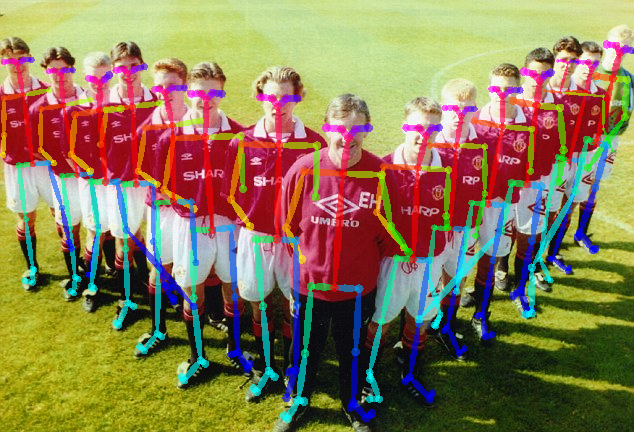

In [9]:
#showing an output from the folder
import cv2
from google.colab.patches import cv2_imshow

files = os.listdir('output_images')
files = [x for x in files if x[0] != '.']

img = cv2.imread('output_images' + os.path.sep + files[0])
cv2_imshow(img)

# Run the following for testing it on a video

In [0]:
os.chdir('/content')
!mkdir output_videos

In [13]:
!mkdir videos
os.chdir('/content/videos')
from google.colab import files
uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
os.chdir('/content')

mkdir: cannot create directory ‘videos’: File exists


Saving test.mp4 to test.mp4
User uploaded file "test.mp4" with length 11351206 bytes


In [14]:
#run detection
file_path = list(uploaded.keys())[0]
video_path = '/content/videos' + os.path.sep + file_path
save_path = '/content/output_videos' + os.path.sep + file_path

print (save_path)

os.chdir('/content/openpose')
!build/examples/openpose/openpose.bin -video $video_path -write_video  $save_path -display 0 -write_video_with_audio 1
os.chdir('/content')

/content/output_videos/test.mp4
Starting OpenPose demo...
Configuring OpenPose...
Starting thread(s)...
Auto-detecting all available GPUs... Detected 1 GPU(s), using 1 of them starting at GPU 0.
ffmpeg version 3.4.6-0ubuntu0.18.04.1 Copyright (c) 2000-2019 the FFmpeg developers
built with gcc 7 (Ubuntu 7.3.0-16ubuntu3)
configuration: --prefix=/usr --extra-version=0ubuntu0.18.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-l

In [16]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open(save_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=600 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)